# Data Exploration

In [1]:
DATA_PATH = "/teamspace/studios/sign-language-dataset/WL-BISINDO/"
METADATA_URL = "https://raw.githubusercontent.com/AceKinnn/WL-BISINDO/refs/heads/main/data_structuring/SI_split_metadata.json"

In [2]:
import os

os.listdir(DATA_PATH)[:5]

['signer0_label0_sample1.mp4',
 'signer0_label0_sample10.mp4',
 'signer0_label0_sample2.mp4',
 'signer0_label0_sample3.mp4',
 'signer0_label0_sample4.mp4']

In [3]:
import urllib
import json

with urllib.request.urlopen(METADATA_URL) as url:
    metadata = json.loads(url.read().decode())
print("Metadata loaded successfully.")

Metadata loaded successfully.


In [6]:
import random
import cv2
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML, Video

# Select three random glosses
random_glosses = random.sample(metadata, 3)

# Create a figure with subplots
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

frames_collection = []

for idx, gloss_data in enumerate(random_glosses):
    gloss = gloss_data['gloss']
    label = gloss_data['label']

    # Get first instance
    instance = gloss_data['instances'][0]
    video_id = instance['video_id']
    video_path = DATA_PATH + video_id + '.mp4'

    # Read frames using OpenCV
    cap = cv2.VideoCapture(video_path)
    frames = []
    try:
        for _ in range(30):  # Capture first 30 frames
            ret, frame = cap.read()
            if not ret:
                break
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            frames.append(frame)
    finally:
        cap.release()

    frames_collection.append(frames)

    # Set title
    axes[idx].set_title(f"Gloss: {gloss}\nLabel: {label}\nVideo: {video_id}", fontsize=10)
    axes[idx].axis('off')

# Create animation
ims = []
if frames_collection:
    max_frames = max(len(f) for f in frames_collection)
    for i in range(max_frames):
        row = []
        for idx, frames in enumerate(frames_collection):
            frame_idx = min(i, len(frames) - 1)
            if frames:
                im = axes[idx].imshow(frames[frame_idx], animated=True)
                row.append(im)
        ims.append(row)

plt.tight_layout()
ani = animation.ArtistAnimation(fig, ims, interval=100, blit=True, repeat_delay=1000)
plt.close() # Prevent static plot from showing
HTML(ani.to_jshtml())

# Key Points Extraction

In [4]:
import sys
import os

# Add the scripts directory to sys.path to import the module
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), '..', 'scripts')))

try:
    import mediapipe_extract
    print("Successfully imported mediapipe_extract")
except ImportError as e:
    print(f"Error importing mediapipe_extract: {e}")
    # Fallback: Download if not present (though I already did it in the terminal)
    if not os.path.exists('../scripts/mediapipe_extract.py'):
        print("Downloading script...")
        !mkdir -p ../scripts
        !curl -o ../scripts/mediapipe_extract.py https://raw.githubusercontent.com/AI4Bharat/OpenHands/refs/heads/main/scripts/mediapipe_extract.py
        import mediapipe_extract
        print("Downloaded and imported.")

/teamspace/studios/this_studio/fsl-bisindo/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
I0000 00:00:1765718650.892475   33678 gl_context_egl.cc:85] Successfully initialized EGL. Major : 1 Minor: 5
I0000 00:00:1765718650.967453   34506 gl_context.cc:357] GL version: 3.2 (OpenGL ES 3.2 NVIDIA 570.195.03), renderer: Tesla T4/PCIe/SSE2


Successfully imported mediapipe_extract


INFO: Created TensorFlow Lite XNNPACK delegate for CPU.
W0000 00:00:1765718651.141571   34499 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1765718651.313873   34494 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1765718651.316448   34493 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1765718651.316622   34494 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1765718651.318572   34492 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1765718651.328606   34

In [7]:
# Select a sample video for extraction
sample_instance = metadata[0]['instances'][0]
video_id = sample_instance['video_id']
video_path = os.path.join(DATA_PATH, video_id + '.mp4')

print(f"Extracting keypoints for video: {video_path}")

# Load frames
frames = mediapipe_extract.load_frames_from_video(video_path)
print(f"Loaded {len(frames)} frames.")

# Extract keypoints
# Note: This might take a moment depending on the video length and hardware
keypoints, confs = mediapipe_extract.get_holistic_keypoints(frames)

print(f"Keypoints shape: {keypoints.shape}")
print(f"Confidences shape: {confs.shape}")

Extracting keypoints for video: /teamspace/studios/sign-language-dataset/WL-BISINDO/signer3_label23_sample4.mp4
Loaded 57 frames.


/teamspace/studios/this_studio/fsl-bisindo/.venv/lib/python3.12/site-packages/google/protobuf/symbol_database.py:55: UserWarning: SymbolDatabase.GetPrototype() is deprecated. Please use message_factory.GetMessageClass() instead. SymbolDatabase.GetPrototype() will be removed soon.
  warnings.warn('SymbolDatabase.GetPrototype() is deprecated. Please '


Keypoints shape: (57, 543, 3)
Confidences shape: (57, 543)


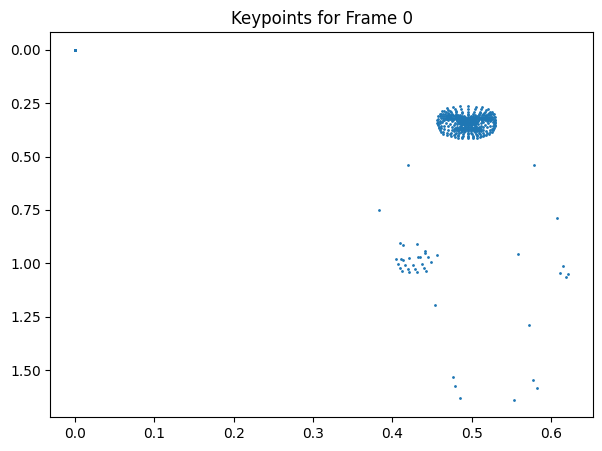

In [10]:
import matplotlib.pyplot as plt

# Visualize the keypoints for the first frame
if len(keypoints) > 0:
    frame_kps = keypoints[1]

    # Separate x and y (ignore z for 2D plot)
    x = frame_kps[:, 0]
    y = frame_kps[:, 1]

    plt.figure(figsize=(7, 5))
    plt.scatter(x, y, s=1)
    plt.gca().invert_yaxis() # Image coordinates have y going down
    plt.title("Keypoints for Frame 0")
    plt.show()

## Apply Key Points Extraction For All Videos

In [6]:
from tqdm import tqdm
from joblib import Parallel, delayed
import multiprocessing

OUTPUT_DIR = "../data/keypoints/"
os.makedirs(OUTPUT_DIR, exist_ok=True)

# Define the function to process a single video
def process_video(video_info):
    video_path, output_path = video_info

    # Re-import inside the function to ensure it works in parallel workers
    import sys
    import os

    # Ensure scripts dir is in path for the worker process
    # We assume the worker starts in the same CWD as the notebook
    script_path = os.path.abspath(os.path.join(os.getcwd(), '..', 'scripts'))
    if script_path not in sys.path:
        sys.path.append(script_path)

    import mediapipe_extract
    import mediapipe as mp
    import numpy as np

    if os.path.exists(output_path):
        return

    if not os.path.exists(video_path):
        return

    try:
        # Create a fresh instance of Holistic for each video
        # We pass this explicitly to avoid the issue where the default instance gets closed
        holistic = mp.solutions.holistic.Holistic(static_image_mode=False, model_complexity=2)

        frames = mediapipe_extract.load_frames_from_video(video_path)

        if len(frames) == 0:
            return

        keypoints, confs = mediapipe_extract.get_holistic_keypoints(frames, holistic=holistic)
        np.save(output_path, keypoints)
    except Exception as e:
        # Print error but don't stop the whole process
        print(f"Error processing {video_path}: {e}")

# Prepare the list of tasks
tasks = []
for item in metadata:
    for instance in item['instances']:
        video_id = instance['video_id']
        video_path = os.path.join(DATA_PATH, video_id + '.mp4')
        output_path = os.path.join(OUTPUT_DIR, video_id + '.npy')
        tasks.append((video_path, output_path))

# Run in parallel
n_cores = multiprocessing.cpu_count()
print(f"Processing {len(tasks)} videos using {n_cores} cores...")

# Use joblib to parallelize
Parallel(n_jobs=n_cores, backend="loky")(
    delayed(process_video)(task) for task in tqdm(tasks)
)

W0000 00:00:1765724247.151226   95915 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1765724247.167585   95892 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1765724247.170273   95888 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1765724247.171603   95888 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1765724247.191012   95888 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1765724247.217561   95888 inference_feedback_manager.cc:114] Feedback manager 

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,